In [1]:
#mount your drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/MyDrive/LivestockDetection2025')

In [3]:
ls

COCO_Format/             my_dataset/        yolo12l.pt     yolov10n.onnx
cow_detection_results/   predicted_images/  yolo12m.onnx   yolov10n.pt
dataset_tf_2025/         retinanet/         yolo12m.pt     yolov5/
data.yaml                runs/              yolo12n.onnx   yolov7/
DETR-Livestock/          SSD_Training/      yolo12n.pt     yolov7-tiny.pt
DJI_0486.MP4             testing_images/    yolo12s.onnx   yolov8x.onnx
DJI_0618.MP4             ultralytics/       yolo12s.pt     yolov8x.pt
EfficientDet_Training/   yolo11n.pt         yolo12x.onnx   yolov9e.pt
Faster-RCNN_checkpoint/  yolo11x.onnx       yolo12x.pt
labels.txt               yolo11x.pt         YOLO-NAS/
models/                  yolo12l.onnx       yolo_nas_l.pt


In [8]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17521, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 17521 (delta 9), reused 0 (delta 0), pack-reused 17497 (from 4)
Receiving objects: 100% (17521/17521), 16.62 MiB | 18.98 MiB/s, done.
Resolving deltas: 100% (12005/12005), done.


In [9]:
%%bash
cd yolov5
pip install -r requirements.txt

In [10]:
os.chdir('yolov5')

In [11]:
ls

benchmarks.py    data/       LICENSE         README.zh-CN.md   tutorial.ipynb
CITATION.cff     detect.py   models/         requirements.txt  utils/
classify/        export.py   pyproject.toml  segment/          val.py
CONTRIBUTING.md  hubconf.py  README.md       train.py


In [13]:
!python train.py --data data.yaml --cfg yolov5s.yaml --batch-size 8 --name Model --epochs 100

Streaming output truncated to the last 5000 lines.
      15/99      2.12G    0.05314        0.1          0        334        640:  44% 12/27 [00:05<00:08,  1.71it/s]/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      15/99      2.12G    0.05214    0.09727          0        112        640:  48% 13/27 [00:06<00:07,  1.90it/s]/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      15/99      2.12G    0.05191    0.09542          0        138        640:  52% 14/27 [00:06<00:05,  2.32it/s]/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. 

In [14]:
#TensorBoard
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model

<IPython.core.display.Javascript object>

In [ ]:
#IMPORTANT UPDATE
#New update in training YOLO model
#For Python 3.10+ users use following command to train yolo model from scratch
#!python train.py --data data.yaml --weights yolov5s.pt --batch-size 8 --name Model --img 640 --epochs 150
#https://drive.google.com/drive/folders/1NCyxALeq3VAoVU68sOnus1TQylGIvZGT?usp=sharing



#In the new update of opencv and YoloV5.
#There is change in command  to export model as .onnx.
#Use below updated command to export model
#!python export.py --weights runs/train/Model2/weights/best.pt --include onnx --simplify

In [15]:
#!python export.py --weights runs/train/Model/weights/best.pt --include torchscript onnx
!python export.py --weights runs/train/Model/weights/best.pt --include onnx --simplify

export: data=data/coco128.yaml, weights=['runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=True, mlmodel=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v7.0-423-g567c6646 Python-3.11.13 torch-2.6.0+cu124 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/Model/weights/best.pt with output shape (1, 25200, 6) (13.8 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 2.2s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.18.0...
requirements: Ultralytics requirements ['onnxruntime', 'onnxslim'] n

In [16]:
from ultralytics import YOLO
from IPython.display import Image

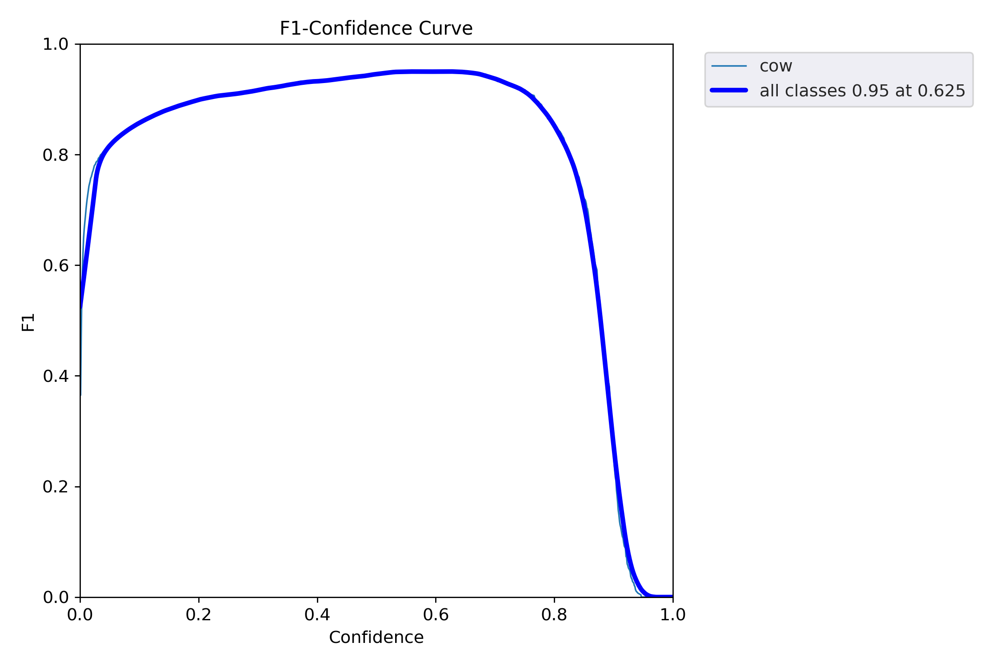

In [17]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/F1_curve.png", width=600)

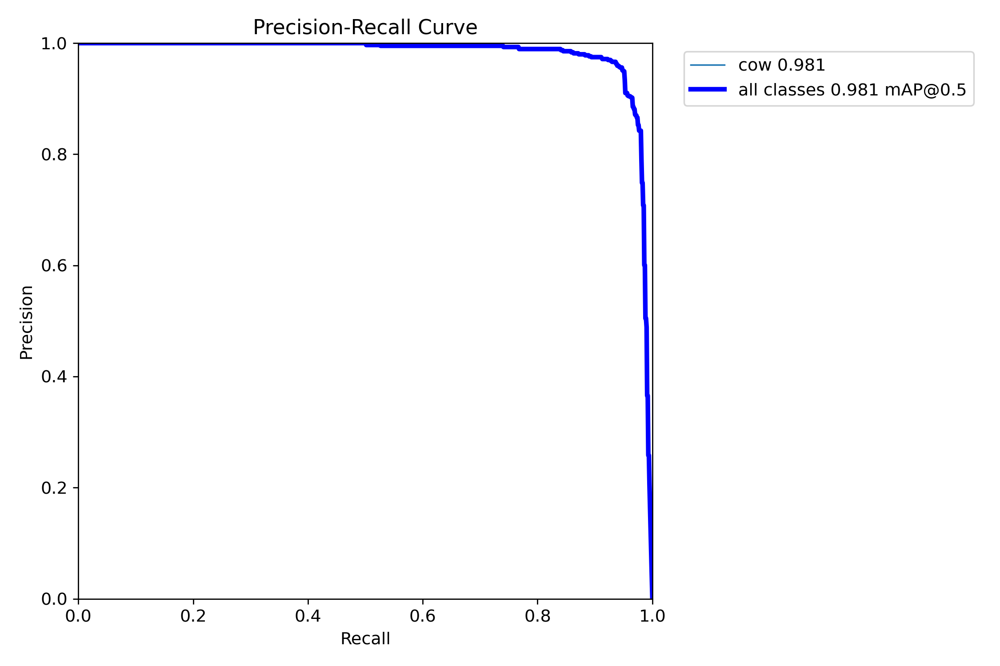

In [18]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/PR_curve.png", width=600)

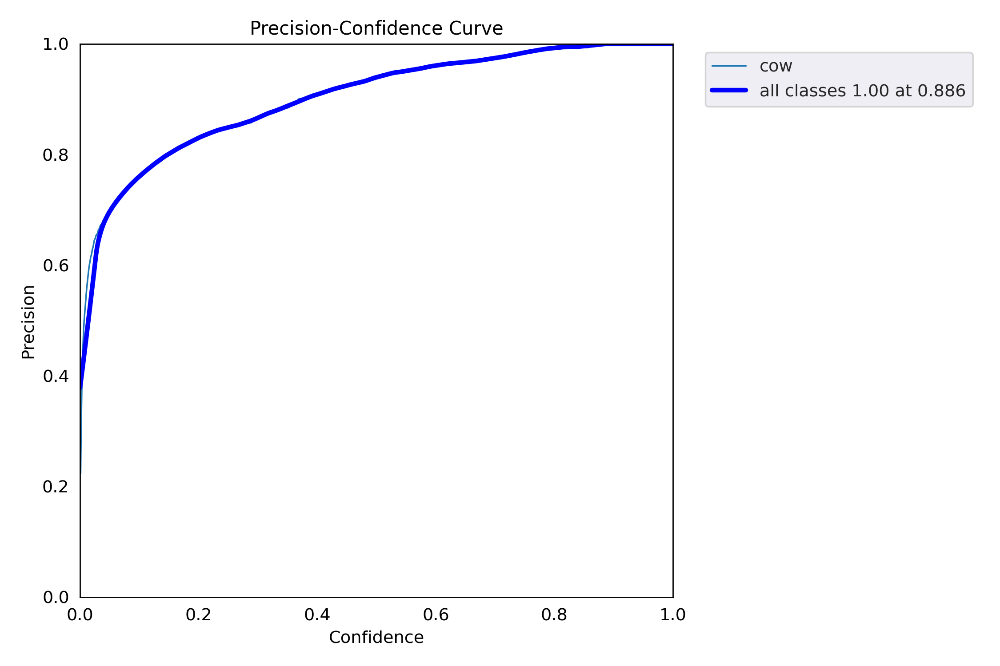

In [19]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/P_curve.png", width=600)

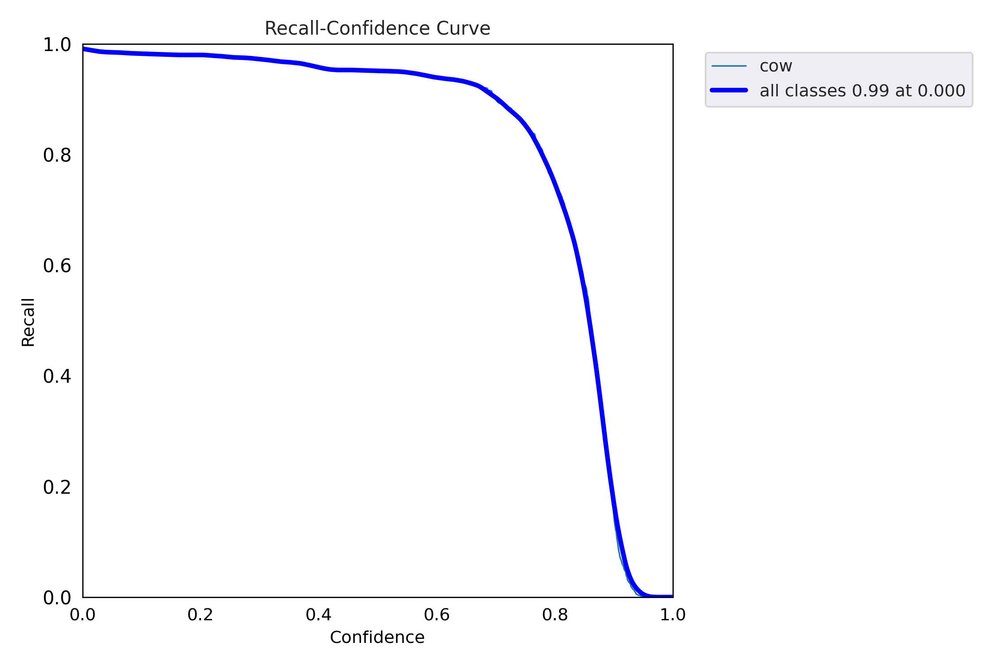

In [20]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/R_curve.png", width=600)

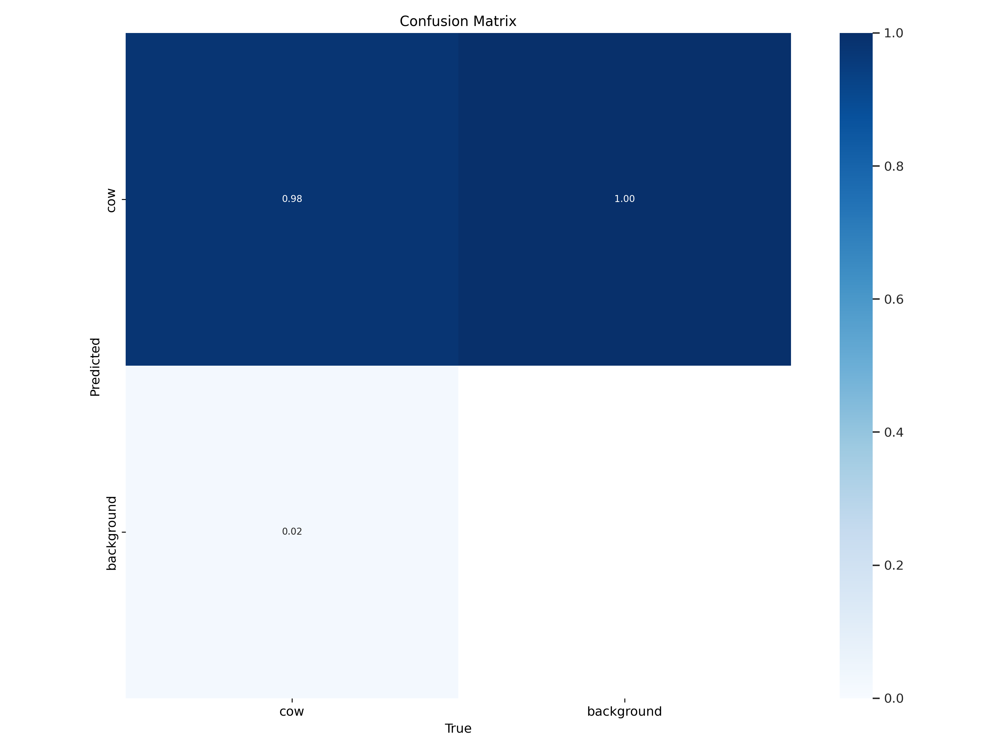

In [21]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/confusion_matrix.png", width=600)

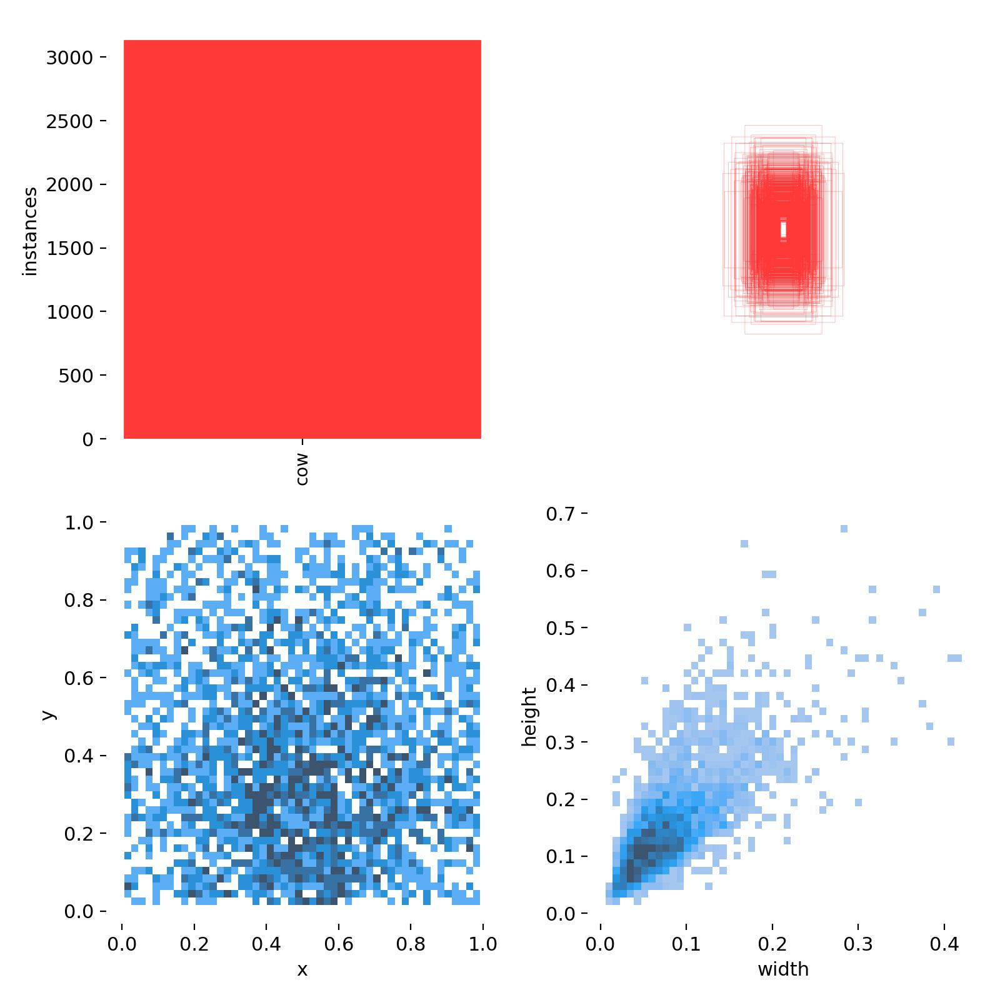

In [22]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/labels.jpg", width=600)

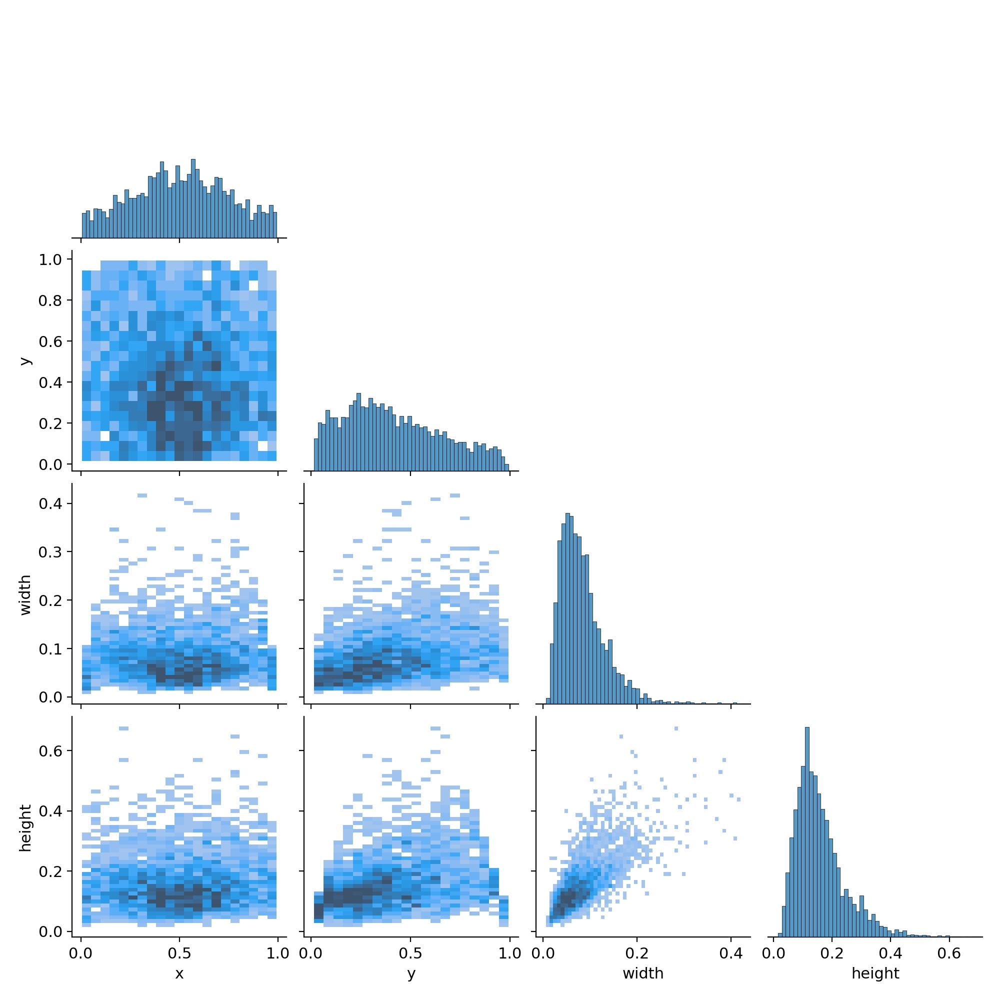

In [23]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/labels_correlogram.jpg", width=600)

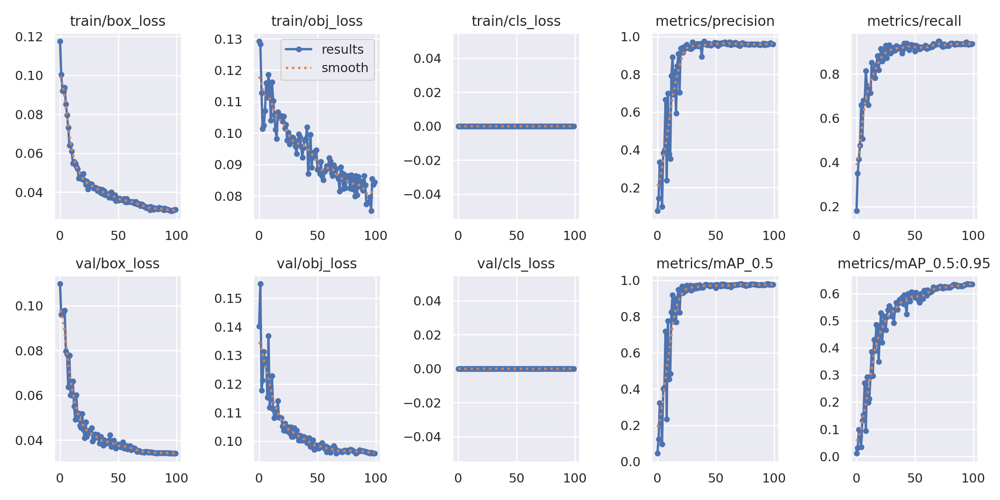

In [24]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/results.png", width=600)

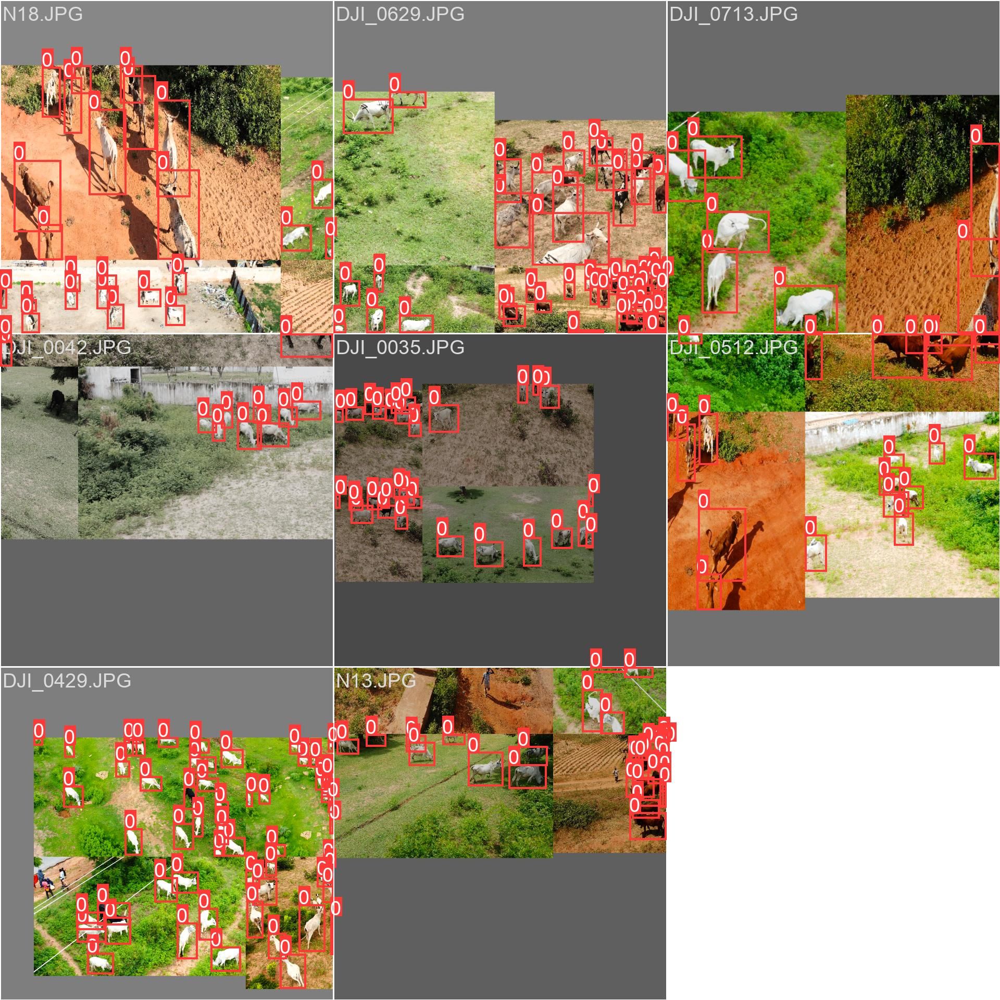

In [25]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/train_batch0.jpg", width=600)

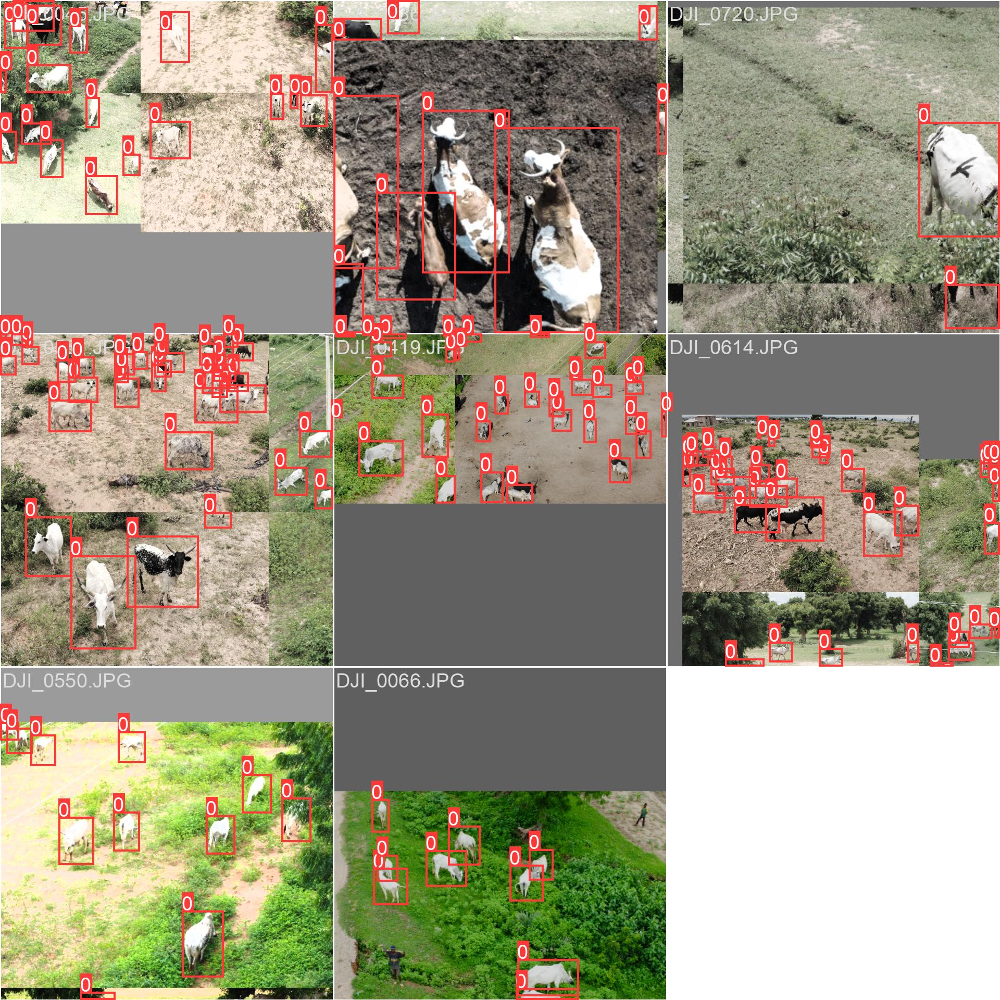

In [26]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/train_batch1.jpg", width=600)

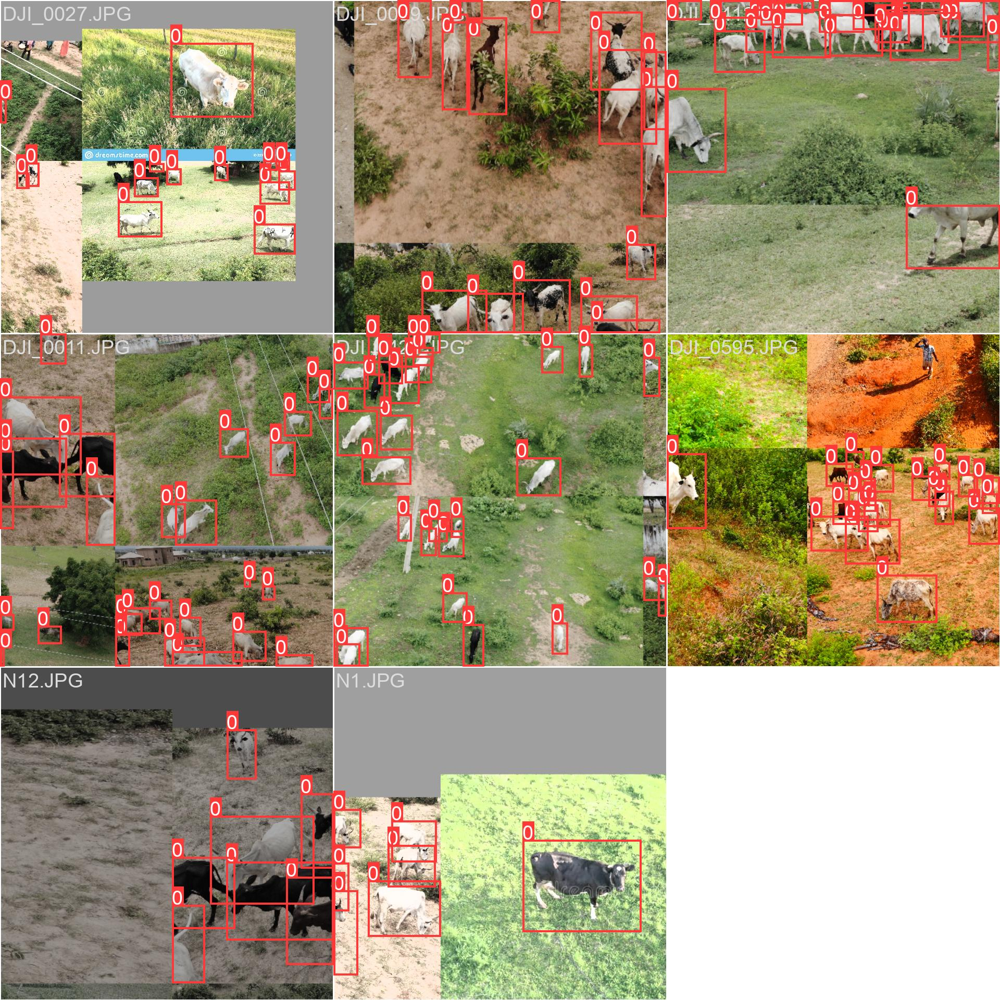

In [27]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/train_batch2.jpg", width=600)

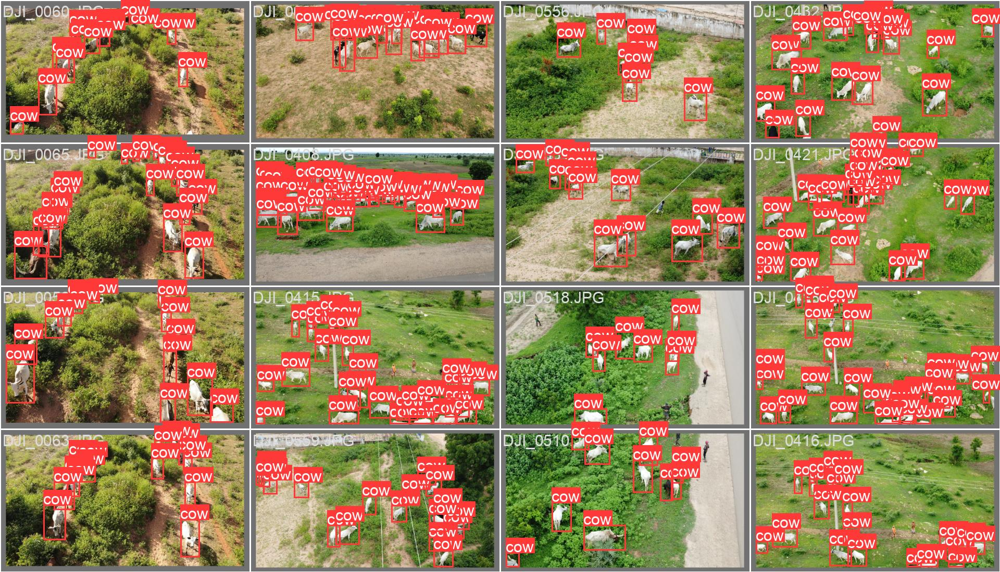

In [28]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/val_batch0_labels.jpg", width=600)

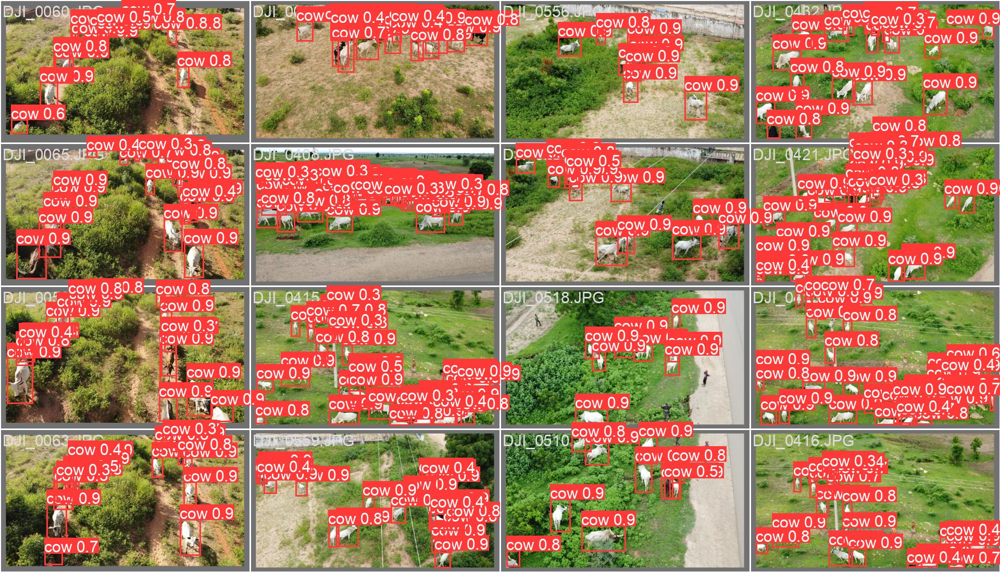

In [29]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/val_batch0_pred.jpg", width=600)

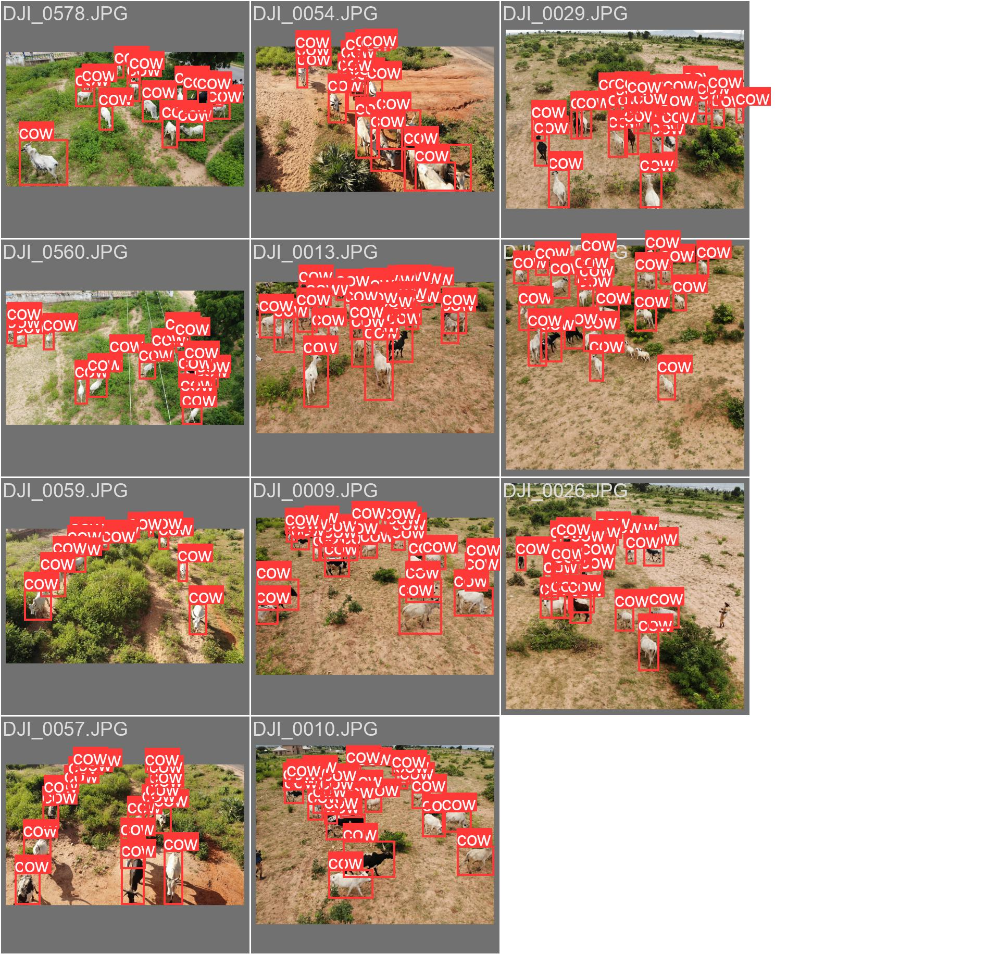

In [30]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/val_batch1_labels.jpg", width=600)

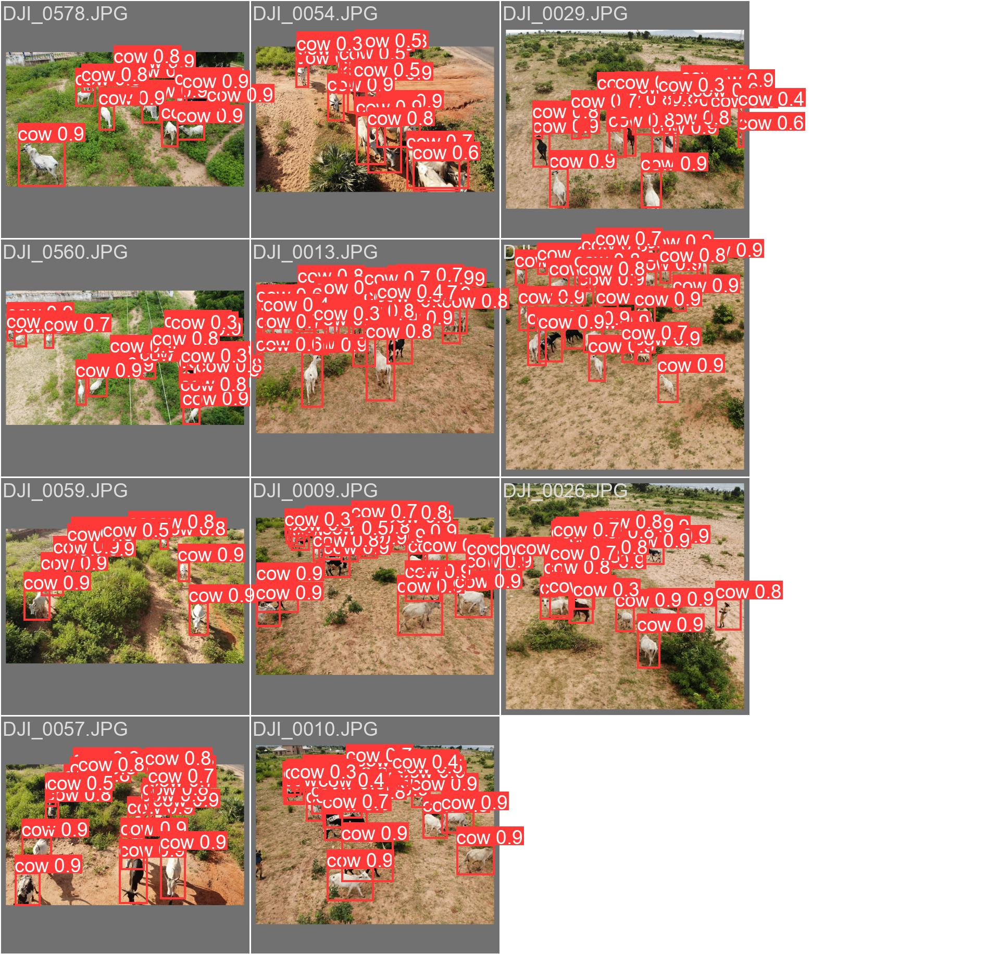

In [31]:
Image("/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/val_batch1_pred.jpg", width=600)

In [38]:
# Ensure we are in the YOLOv5 directory
import os
os.chdir('/content/drive/MyDrive/LivestockDetection2025/yolov5')

# Run inference using the modified detect.py script
!python detect.py --weights /content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/weights/best.pt --source /content/drive/MyDrive/LivestockDetection2025/testing_images/DJI_0509.JPG

detect: weights=['/content/drive/MyDrive/LivestockDetection2025/yolov5/yolov5/runs/train/Model/weights/best.pt'], source=/content/drive/MyDrive/LivestockDetection2025/testing_images/DJI_0509.JPG, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-421-g79c4c31d Python-3.11.13 torch-2.1.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/LivestockDetection2025/testing_images/DJI_0509.JPG: 384x640 23 cows, 102.5ms
Speed: 0.6ms pre-process, 102.5ms inference, 122.6ms NMS per image at sha

Testing

In [ ]:
os.chdir('yolov5')

In [ ]:
!ls

benchmarks.py	 detect.py   __pycache__       runs	       val.py
CITATION.cff	 export.py   pyproject.toml    segment	       yolov5s.pt
classify	 hubconf.py  README.md	       train.py
CONTRIBUTING.md  LICENSE     README.zh-CN.md   tutorial.ipynb
data		 models      requirements.txt  utils


In [ ]:
%%bash
cd yolov5
pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 96.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 101.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 67.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

bash: line 1: cd: yolov5: No such file or directory


In [33]:
!pip uninstall torch torchvision torchaudio -y
!pip install torch==2.1.0 torchvision==0.16.0 torchaudio==2.1.0 --index-url https://download.pytorch.org/whl/cu121


Found existing installation: torch 2.6.0+cu124
Uninstalling torch-2.6.0+cu124:
  Successfully uninstalled torch-2.6.0+cu124
Found existing installation: torchvision 0.21.0+cu124
Uninstalling torchvision-0.21.0+cu124:
  Successfully uninstalled torchvision-0.21.0+cu124
Found existing installation: torchaudio 2.6.0+cu124
Uninstalling torchaudio-2.6.0+cu124:
  Successfully uninstalled torchaudio-2.6.0+cu124
Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 GB 921.5 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 69.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 73.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 27.2 MB/s eta 0:00:00
  Attempting uninstall: triton
    Found existing installation: triton 3.2.0
    Uninstalling triton-3.2.0:
      Successfully uninstalled triton-3.2.0


In [ ]:
!pwd

/content/drive/MyDrive/LivestockDetection2025/yolov5


In [34]:
import torch

In [35]:
!pip install numpy

In [ ]:
# Ensure we are in the YOLOv5 directory
import os
os.chdir('/content/drive/MyDrive/LivestockDetection2025/yolov5')

# Run inference using the modified detect.py script
!python detect.py --weights runs/train/Model4/weights/best.pt --source /content/drive/MyDrive/LivestockDetection2025/testing_images/DJI_0509.JPG

detect: weights=['runs/train/Model4/weights/best.pt'], source=/content/drive/MyDrive/LivestockDetection2025/testing_images/DJI_0509.JPG, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-421-g79c4c31d Python-3.11.13 torch-2.1.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
image 1/1 /content/drive/MyDrive/LivestockDetection2025/testing_images/DJI_0509.JPG: 384x640 25 cows, 99.7ms
Speed: 0.7ms pre-process, 99.7ms inference, 108.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp7


In [37]:
!pip uninstall numpy -y
!pip install 'numpy<2'

Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 105.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
